In [1]:
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import sys

import albumentations as A
from albumentations.pytorch import ToTensorV2
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, random_split
from torchvision.utils import make_grid
from torch.utils.data import Subset

In [2]:
ROOT_PATH = Path.cwd().parent
DATA_PATH = ROOT_PATH / "data"
sys.path.append(ROOT_PATH.as_posix())

VAL_SIZE = 0.2
BATCH_SIZE = 32
SEED = 42

In [3]:
from src.data import LeafDataset, get_image_labels
from src.augmentation import get_augmentations
from src.config import AugmentationConfig

In [4]:
config = AugmentationConfig()

In [5]:
train_augs, test_augs = get_augmentations(**config.model_dump())

/Users/philippmoehl/anaconda3/envs/plants/lib/python3.10/site-packages/albumentations/augmentations/blur/transforms.py:184: UserWarning: blur_limit and sigma_limit minimum value can not be both equal to 0. blur_limit minimum value changed to 3.
  warnings.warn(
/Users/philippmoehl/anaconda3/envs/plants/lib/python3.10/site-packages/albumentations/augmentations/dropout/cutout.py:49: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  warnings.warn(


In [10]:
image_paths, labels = get_image_labels(DATA_PATH)

img_paths_tr, img_paths_val, labels_tr, labels_val = train_test_split(
    image_paths, labels, test_size=VAL_SIZE, random_state=SEED)

train_dataset = LeafDataset(img_paths_tr, labels_tr, transform=train_augs)
val_dataset = LeafDataset(img_paths_val, labels_val, transform=test_augs)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

In [11]:
def show_batch(data, title):
    for images, labels in data:
        fig, ax = plt.subplots(figsize=(30, 30))
        ax.set_title(title)
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=8).permute(1, 2, 0))
        break

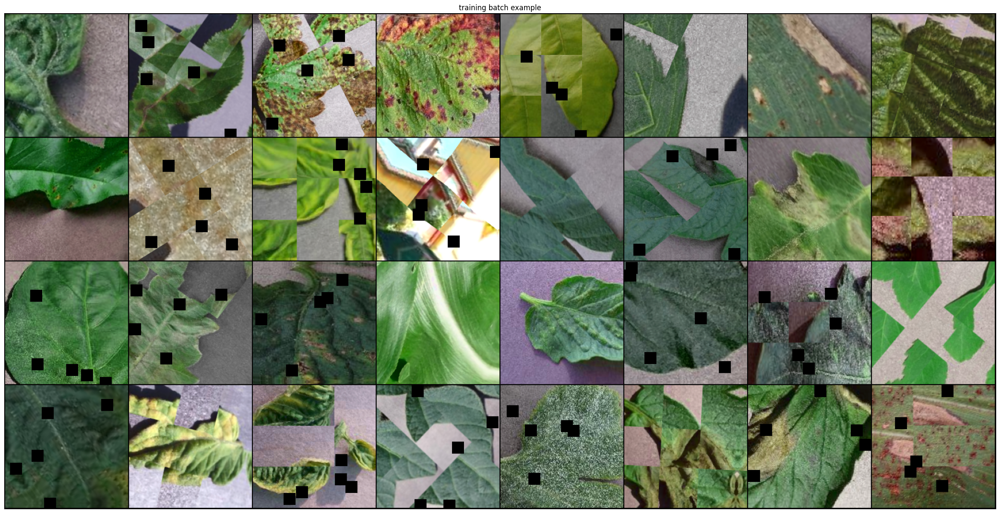

In [12]:
show_batch(train_loader, title="training batch example")

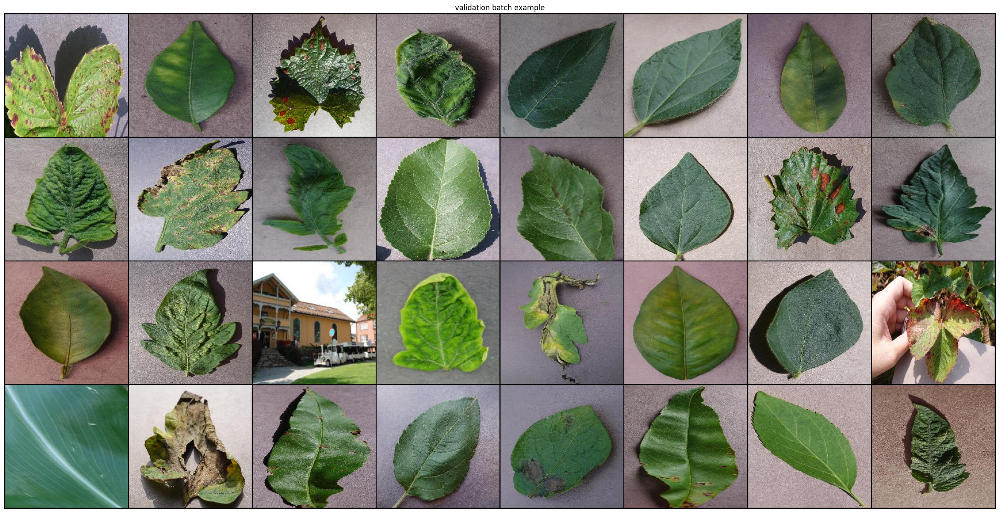

In [13]:
show_batch(val_loader, title="validation batch example")